<div align=center>
		
<p></p>
<p></p>
<font size=5>
In the Name of God
<font/>
<p></p>
 <br/>
    <br/>
<font color=#4d7db8>
Sharif University of Technology - Department of Electrical Engineering
</font>
<p></p>
<font color=#4d7db8>
Introduction To Machine Learning - Dr. Sajjad Amini
</font>
<br/>
<br/>
Spring Semester 1401-02

<div/>

<hr/>
		<div align=center>
		    <font color=red size=6>
			    <br />
Project - 3rd Phase
<br />
Image Super Resolution using Autoencoder
			</font>
    <br/>
<font size=4>
			<br/><br/>
Due on Tir 10th
                <br/><b>
              Cheating is Strongly Prohibited
                </b><br/><br/>
                <font color=green>
Should you have any questions concerning the project, please feel free to ask via Telegram.
     </font>
</font>
                <br/>
    </div>

# Personal Info
<hr/>
    <div class="column" align=center>
    <font size=4>
        <div class="column">
        <br />
            student_number = 99101416
            <br />
            Name = Mohammadreza   
            <br />
            Last_Name = Hajibabaei
        </div>
        <div class="column">
        <br />
            student_number = 400102222
            <br />
            Name = Amirreza
            <br />
            Last_Name =  Velae 
        </div>
    </font>
    </div>


1. Download the "image super resolution (from unsplash)" dataset and split it's validation set to new validation set and test set.
2. Design and train an AutoEncoder using `PyTorch` (not `TensorFlow`) on the dataset to enhance the resolution of images from low resolution to high resolution.
3. plot learning curve and visualize low resolution images of test set, their corresponding high resolution images and their reconstructed versions side by side.

# Import Necessary Libraries

In [2]:
import numpy as np 
import pandas as pd 
import os
import re
import torch
import torchvision
import matplotlib.pyplot as plt
from torch.utils.data import TensorDataset, DataLoader
from torchvision.datasets import ImageFolder
from torch.utils.data import Subset
from sklearn.model_selection import train_test_split
from torchvision.transforms import Compose, ToTensor, Resize
from torchvision import datasets,transforms
from typing import Dict
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import cv2
from tensorflow.keras.preprocessing.image import img_to_array

# Load Dataset and Prepare It

In [3]:
#using the csv file to match the low and high res images
base_directory = 'Image Super Resolution - Unsplash'
hires_folder = os.path.join(base_directory, 'high res')
lowres_folder = os.path.join(base_directory, 'low res')

data = pd.read_csv("Image Super Resolution - Unsplash/image_data.csv")
data['low_res'] = data['low_res'].apply(lambda x: os.path.join(lowres_folder,x))
data['high_res'] = data['high_res'].apply(lambda x: os.path.join(hires_folder,x))
data.head()

,low_res,high_res
0,Image Super Resolution - Unsplash\low res\1_2.jpg,Image Super Resolution - Unsplash\high res\1.jpg
1,Image Super Resolution - Unsplash\low res\2_2.jpg,Image Super Resolution - Unsplash\high res\2.jpg
2,Image Super Resolution - Unsplash\low res\3_2.jpg,Image Super Resolution - Unsplash\high res\3.jpg
3,Image Super Resolution - Unsplash\low res\4_2.jpg,Image Super Resolution - Unsplash\high res\4.jpg
4,Image Super Resolution - Unsplash\low res\5_2.jpg,Image Super Resolution - Unsplash\high res\5.jpg


In [4]:
train_set, test_set = train_test_split(data, test_size=0.8)
val_set,test_set=train_test_split(test_set, test_size=0.2)
print(len(train_set))
print(len(test_set))
low_trainData = []
high_trainData = []

for low_res , high_res in zip(train_set.low_res,train_set.high_res):
    
    lowResize = cv2.resize(cv2.cvtColor(cv2.imread(low_res),cv2.COLOR_BGR2RGB),(600,400))
    highResize = cv2.resize(cv2.cvtColor(cv2.imread(high_res),cv2.COLOR_BGR2RGB),(600,400))
    
    low_floatType = lowResize.astype(np.float32) / 255.
    high_floatType = highResize.astype(np.float32) / 255.
    
    low_trainData.append(np.transpose(img_to_array(low_floatType), (2, 0, 1)))
    high_trainData.append(np.transpose(img_to_array(high_floatType), (2, 0, 1)))
    
    
low_trainData = np.array(low_trainData)
high_trainData = np.array(high_trainData)

train_data = TensorDataset(torch.Tensor(low_trainData), torch.Tensor(high_trainData))
train_data = DataLoader(train_data, batch_size=4, shuffle=True)

752
602


In [5]:
low_testData = []
high_testData = []

for low_res , high_res in zip(test_set.low_res,test_set.high_res):
    
    lowResize = cv2.resize(cv2.cvtColor(cv2.imread(low_res),cv2.COLOR_BGR2RGB),(600,400))
    highResize = cv2.resize(cv2.cvtColor(cv2.imread(high_res),cv2.COLOR_BGR2RGB),(600,400))
    
    low_floatType = lowResize.astype(np.float32) / 255.
    high_floatType = highResize.astype(np.float32) / 255.
    
    low_testData.append(np.transpose(img_to_array(low_floatType), (2, 0, 1)))
    high_testData.append(np.transpose(img_to_array(high_floatType), (2, 0, 1)))
    
    
low_testData = np.array(low_testData)
high_testData = np.array(high_testData)

test_data = TensorDataset(torch.Tensor(low_testData), torch.Tensor(high_testData))
test_data = DataLoader(test_data, batch_size=4, shuffle=True)

# Define Your Model
torch neural network model

In [6]:
class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        

        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(128, 256, 3, padding='same'),
        )    
        self.decoder = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(128, 64, 3, padding='same'),
            nn.ReLU(),
            nn.Conv2d(64, 3, 3, padding='same'),
        )
 
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded
    
autoencoder = Autoencoder()


# Fit The Model
Also Define optimizer, Criterion and other parameters 

In [7]:
criterion = nn.MSELoss()
optimizer = optim.Adam(autoencoder.parameters())

is running
is running
is running
is running
is running
is running
is running
is running
is running
is running


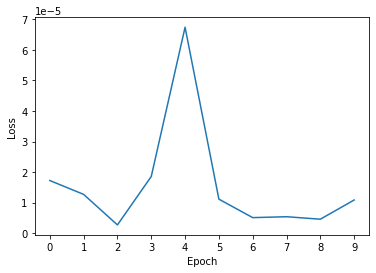

In [8]:
epoch_num = 10
loss_total = []
    
for epoch in range(epoch_num):
    lossOfEpoch = 0.0
    for i, data in enumerate(train_data, 0):
        grayImage, colorImage = data
        reconstructedImage= autoencoder(grayImage)
        loss = criterion(reconstructedImage, colorImage)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        lossOfEpoch =+ loss.item()
    loss_total.append(lossOfEpoch / i)
    print('is running')
plt.plot(loss_total)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.xticks(range(10))
plt.show()

# Plot The Results

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


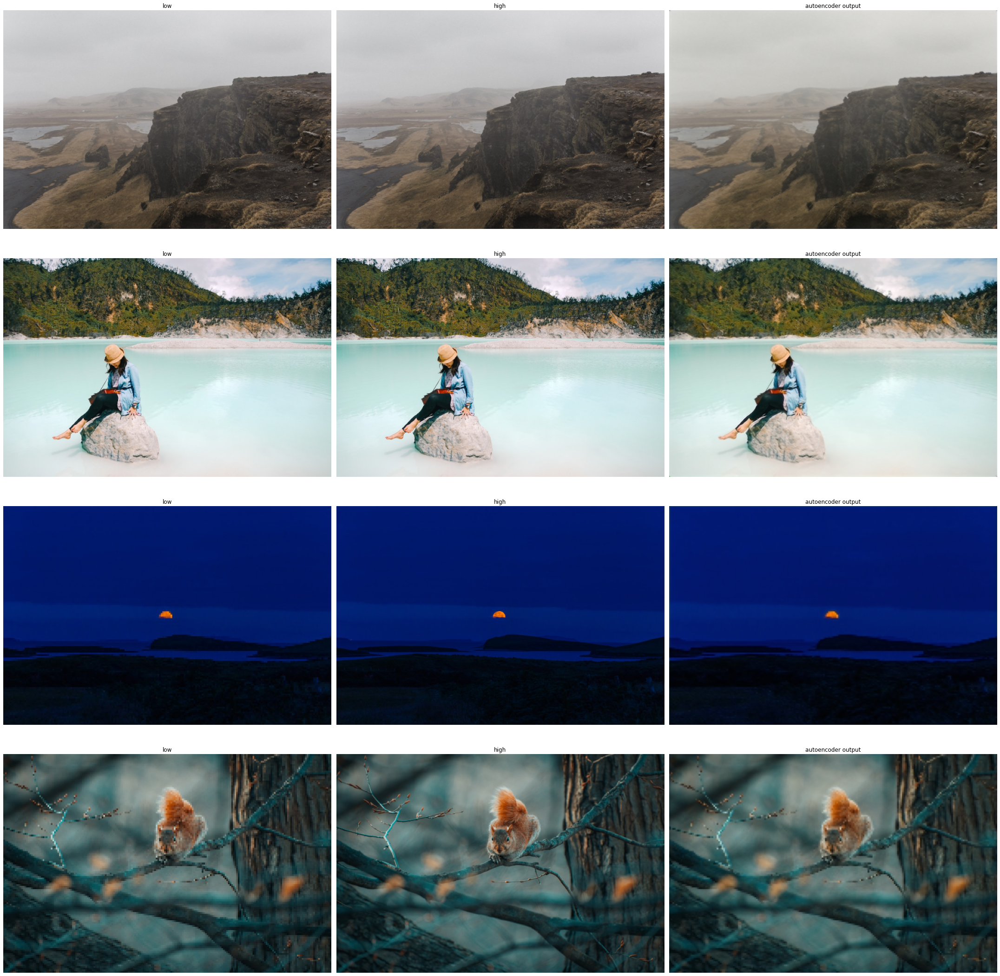

In [15]:
#results after 16 hours 
low_res,high_res = next(iter(test_data))
output = []
for i in range(low_res.shape[0]):
    output.append(autoencoder(low_res[i]))

fig, axs = plt.subplots(4, 3, figsize=(30,30))
for i in range(low_res.shape[0]):
    axs[i, 0].imshow(np.transpose(low_res[i], (1, 2, 0)))
    axs[i, 0].set_title('low')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(np.transpose(high_res[i], (1, 2, 0)))
    axs[i, 1].set_title('high')
    axs[i, 1].axis('off')
    axs[i, 2].imshow(np.transpose(output[i].clone().detach(), (1, 2, 0)))
    axs[i, 2].set_title('autoencoder output')
    axs[i, 2].axis('off')
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


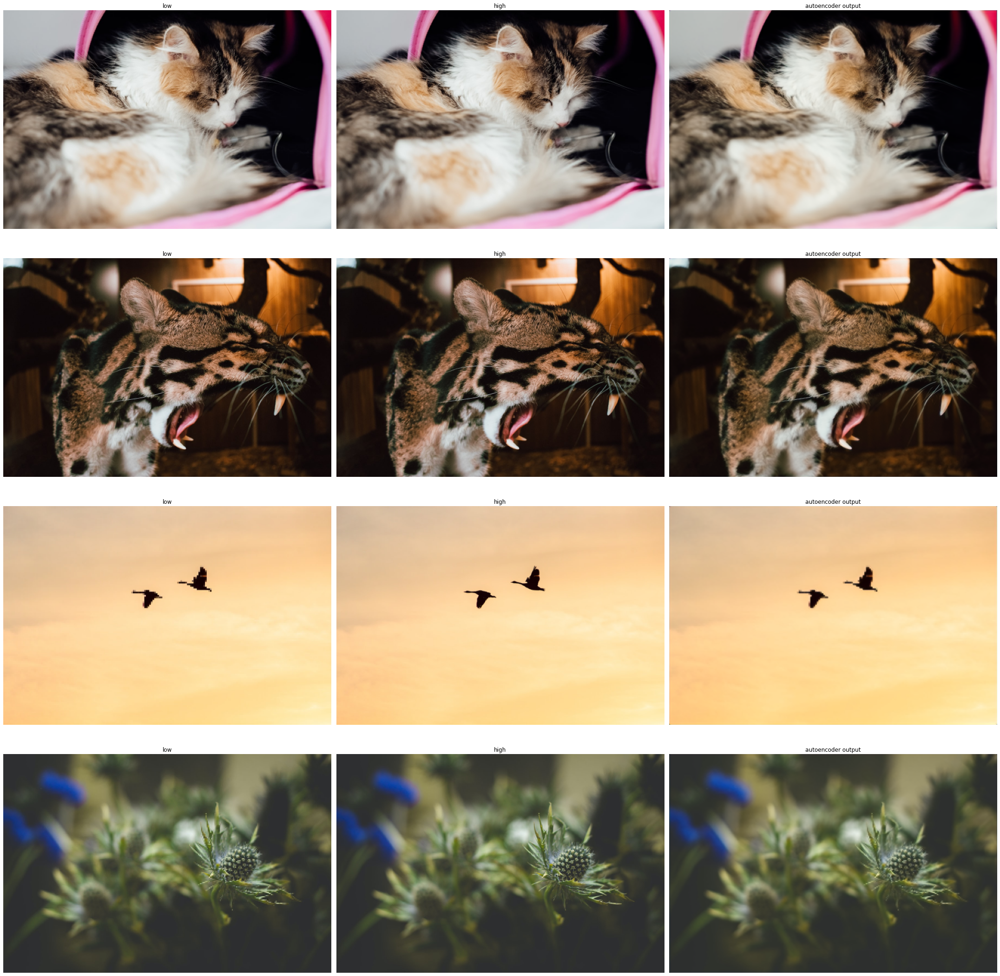

In [14]:
#results after 16 hours 
low_res,high_res = next(iter(test_data))
output = []
for i in range(low_res.shape[0]):
    output.append(autoencoder(low_res[i]))

fig, axs = plt.subplots(4, 3, figsize=(30,30))
for i in range(low_res.shape[0]):
    axs[i, 0].imshow(np.transpose(low_res[i], (1, 2, 0)))
    axs[i, 0].set_title('low')
    axs[i, 0].axis('off')
    axs[i, 1].imshow(np.transpose(high_res[i], (1, 2, 0)))
    axs[i, 1].set_title('high')
    axs[i, 1].axis('off')
    axs[i, 2].imshow(np.transpose(output[i].clone().detach(), (1, 2, 0)))
    axs[i, 2].set_title('autoencoder output')
    axs[i, 2].axis('off')
plt.tight_layout()
plt.show()